In [1]:
import os
import sys
import torch
import torch.nn as nn
import torch.nn.functional as F
from skimage import data
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize
import json
import deepinv as dinv
from skimage.transform import iradon
from torch.utils.data import Dataset, DataLoader
from torch import Tensor
from itertools import repeat
import odl
from odl.phantom import ellipsoid_phantom
from odl import uniform_discr
from Model_arch import UNet


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


/home/ktaghavi/miniconda3/envs/msc_dip_project/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def calculate_psnr(original, denoised):
    """
    Compute PSNR between two NumPy arrays in [0,1], same shape.
    """
    eps = 1e-10
    mse = np.mean((original - denoised) ** 2)
    if mse == 0:
        return 100
    max_pixel = np.max(original)
    return 10 * np.log10(((max_pixel**2) + eps) / mse)

def nabla(x):
        r"""
        Applies the finite differences operator associated with tensors of the same shape as x.
        """
        b, c, h, w = x.shape
        u = torch.zeros((b, c, h, w, 2), device=x.device).type(x.dtype)
        u[:, :, :-1, :, 0] = u[:, :, :-1, :, 0] - x[:, :, :-1]
        u[:, :, :-1, :, 0] = u[:, :, :-1, :, 0] + x[:, :, 1:]
        u[:, :, :, :-1, 1] = u[:, :, :, :-1, 1] - x[..., :-1]
        u[:, :, :, :-1, 1] = u[:, :, :, :-1, 1] + x[..., 1:]
        return u

In [3]:
class OperatorFunction(torch.autograd.Function):
    @staticmethod
    def forward(ctx, operator, x):
        # ctx.operator saved for backward
        ctx.operator = operator
        # call the DeepInv forward operator A
        with torch.no_grad():
            out = operator.A(x)
        # no need to save x unless A is nonlinear
        return out

    @staticmethod
    def backward(ctx, grad_output):
        # in the backward pass, apply the adjoint A_adjoint
        operator = ctx.operator
        grad_input = operator.A_adjoint(grad_output)
        # first returned None says “no gradient for operator”
        return None, grad_input

class OperatorModule(torch.nn.Module):
    def __init__(self, operator):
        super().__init__()
        self.operator = operator

    def forward(self, x):
        # call our custom Function
        return OperatorFunction.apply(self.operator, x)

    def A_dagger(self, y):
        # if you ever want to call the adjoint directly
        return self.operator.A_dagger(y)

In [4]:
angles_torch = torch.linspace(0,180,60,device=device)
physics_raw = dinv.physics.Tomography(
    img_width=256, angles=angles_torch, device=device,
    noise_model=dinv.physics.GaussianNoise(sigma=0.05)
)

physics = OperatorModule(physics_raw)

Data shape: torch.Size([1, 1, 256, 256])


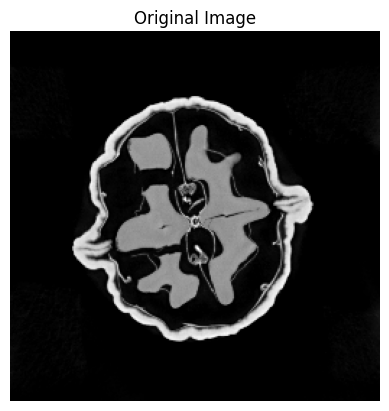

Data shape after unsqueeze: torch.Size([1, 1, 256, 256])


In [5]:
walnut_data = torch.load("walnut.pt", map_location=device)
walnut_data = walnut_data.to(device)

print("Data shape:", walnut_data.shape)

img_walnut = walnut_data.squeeze().cpu().numpy()
plt.imshow(img_walnut, cmap='gray')
plt.title("Original Image")
plt.axis('off')
plt.show()
plt.close()

if walnut_data.ndim == 3:
    walnut_data = walnut_data.unsqueeze(0)
elif walnut_data.ndim == 2:
    walnut_data = walnut_data.unsqueeze(0).unsqueeze(0)
print("Data shape after unsqueeze:", walnut_data.shape)

epochs = 6000

### classical TV‐minimization in ODL

Iteration 4679, current converge crit. = 1.00E-05, objective = 1.00E-05 
FBP    PSNR: -65.02 dB
TV-PGD PSNR: 25.73 dB


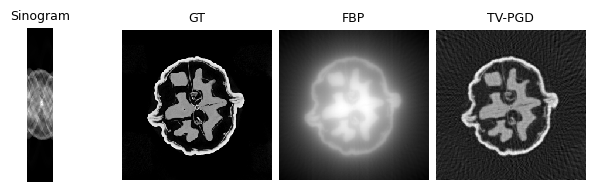

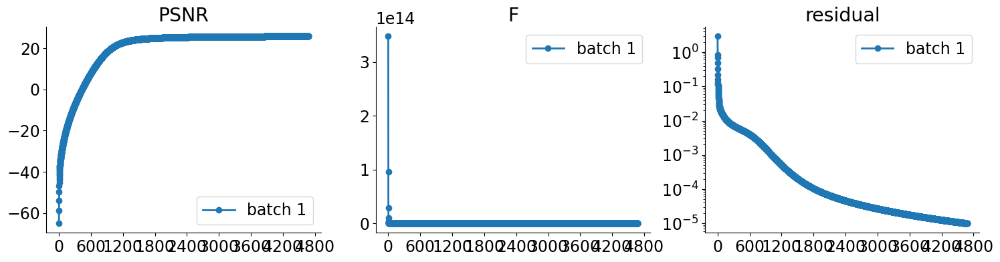

In [6]:
from deepinv.optim.data_fidelity import L2
from deepinv.optim.prior        import TVPrior
from deepinv.optim.optimizers   import optim_builder


if isinstance(walnut_data, dict):
    walnut = walnut_data["walnut"]
else:
    walnut = walnut_data
walnut = walnut.to(device)

# 3) Simulate data
y = physics_raw.A(walnut)    # forward project → [1,1,det,ang]

# 4) Set up TV–PGD solver
data_fidelity = L2()
prior = TVPrior(n_it_max=20)


# Algorithm parameters
verbose = True
stepsize = 1e-4 # stepsize for PGD
lamb = 1e-2  # TV regularisation parameter
params_algo = {"stepsize": stepsize, "lambda": lamb}
max_iter = 10000
early_stop = True

# Instantiate the algorithm class to solve the problem.
model = optim_builder(
    iteration="PGD",
    prior=prior,
    data_fidelity=data_fidelity,
    early_stop=early_stop,
    max_iter=max_iter,
    verbose=verbose,
    params_algo=params_algo,
)

# 5) Run FBP and TV–PGD
x_lin = physics_raw.A_adjoint(y)       # pure back‐projection
x_model, metrics = model(
    y,
    physics=physics_raw,
    x_gt=walnut,
    compute_metrics=True,
)

# 6) Compute PSNR
psnr_fbp = dinv.metric.PSNR()(walnut, x_lin).item()
psnr_tv  = dinv.metric.PSNR()(walnut, x_model).item()

print(f"FBP    PSNR: {psnr_fbp:.2f} dB")
print(f"TV-PGD PSNR: {psnr_tv:.2f} dB")

# 7) Plot results
imgs   = [y, walnut, x_lin, x_model]
titles = ["Sinogram", "GT", "FBP", "TV-PGD"]
dinv.utils.plot(imgs, titles=titles)

# 8) Plot convergence curves if available
if metrics:
    dinv.utils.plot_curves(metrics)
psnr_classic = metrics["psnr"][-1]

### DIP with Ellipses Pre Trained Weight

In [7]:
from Model_arch import UNet

angles_torch = torch.linspace(0, 180, 60, dtype = torch.float32, device=device) 
Height, Width = walnut_data.shape[-2], walnut_data.shape[-1]
physics_raw = dinv.physics.Tomography(
    img_width = Width, 
    angles=angles_torch, 
    device=device,
    noise_model=dinv.physics.GaussianNoise(sigma=0.8)
)
physics_new = OperatorModule(physics_raw)

ellipse_model = UNet(1,1)
ellipse_pretrained_weight= torch.load("checkpoints/pre_model.pth", map_location=device)
ellipse_model.load_state_dict(ellipse_pretrained_weight)
ellipse_model.to(device)

UNet(
  (encoder1): Encoder(
    (conv1): ConvBlock(
      (conv): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (act): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (conv2): ConvBlock(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (act): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (downsample): ConvBlock(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (act): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (encoder2): Encoder(
    (conv1): ConvBlock(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (act): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (conv2): ConvBlock(
      (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (act): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (downsample): ConvBlock(
      (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 

Shape of z: torch.Size([1, 1, 256, 256])
Epoch 0, Loss: 2293.4502
PSNR: 8.13 dB


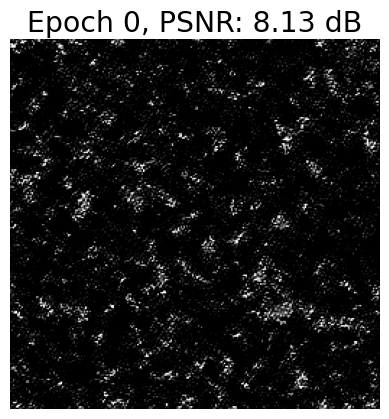

Epoch 100, Loss: 45.8426
PSNR: 12.38 dB


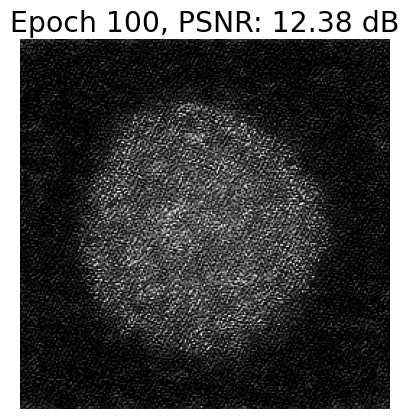

Epoch 200, Loss: 31.1532
PSNR: 12.89 dB


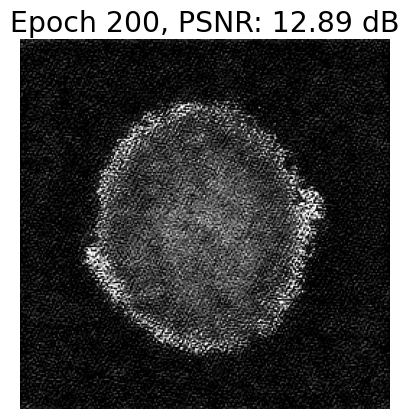

Epoch 300, Loss: 27.5414
PSNR: 13.11 dB


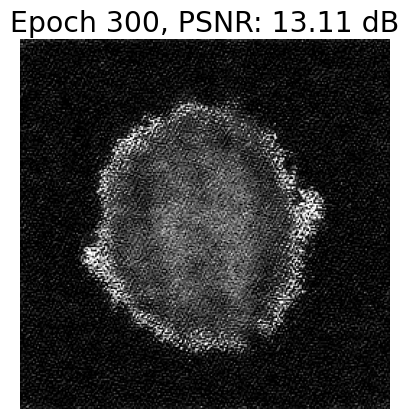

Epoch 400, Loss: 13.5630
PSNR: 13.96 dB


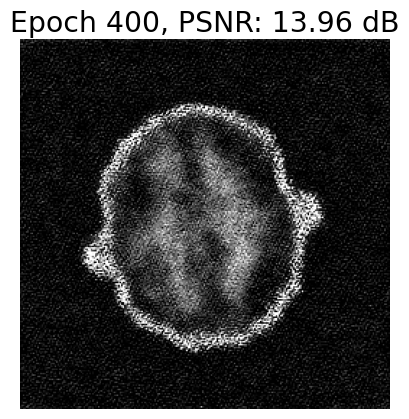

Epoch 500, Loss: 8.9547
PSNR: 14.58 dB


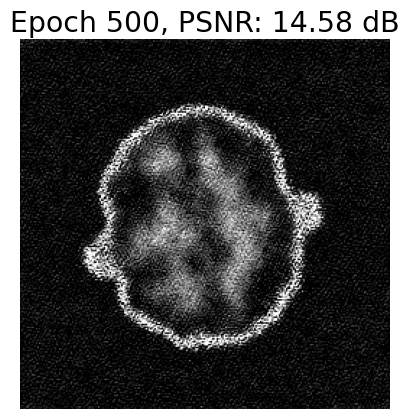

Epoch 600, Loss: 8.5251
PSNR: 15.04 dB


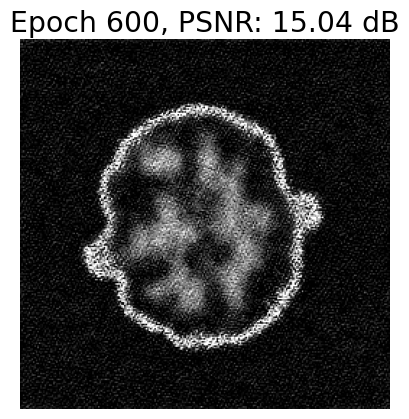

Epoch 700, Loss: 5.4039
PSNR: 15.43 dB


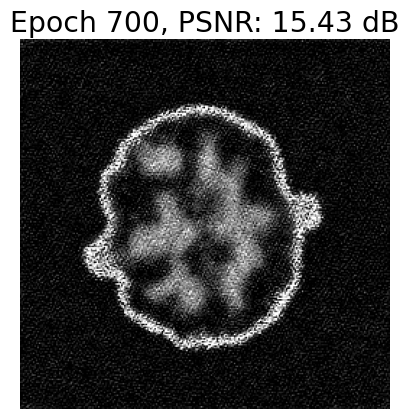

Epoch 800, Loss: 6.3354
PSNR: 15.73 dB


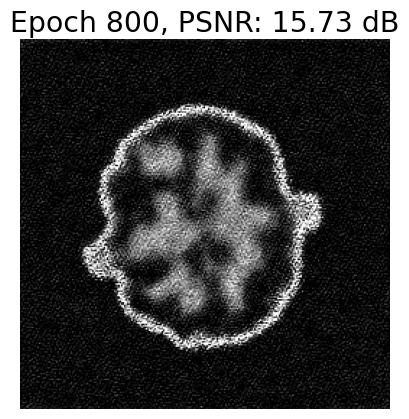

Epoch 900, Loss: 4.2009
PSNR: 15.99 dB


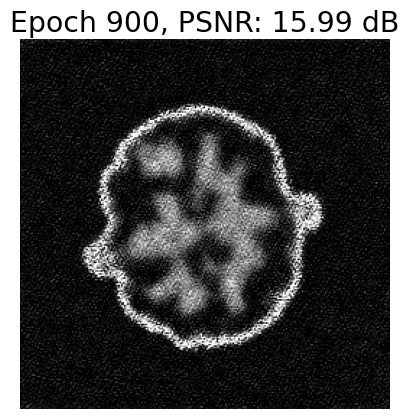

Epoch 1000, Loss: 3.7365
PSNR: 16.27 dB


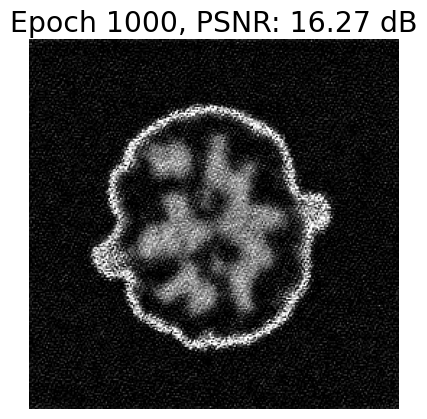

Epoch 1100, Loss: 4.7826
PSNR: 16.45 dB


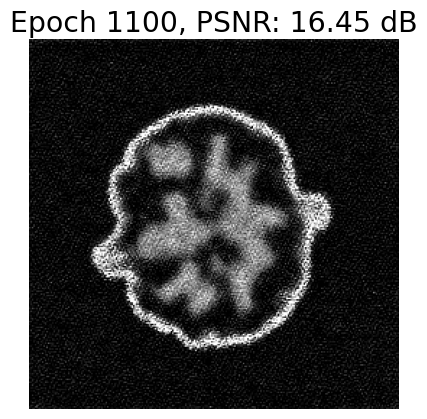

Epoch 1200, Loss: 3.8042
PSNR: 16.65 dB


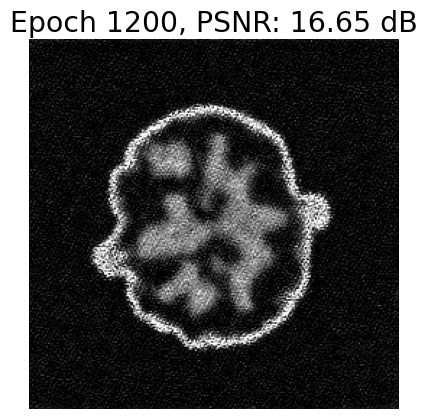

Epoch 1300, Loss: 3.5189
PSNR: 16.91 dB


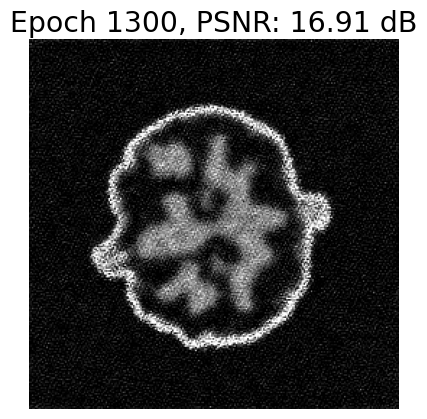

Epoch 1400, Loss: 3.0624
PSNR: 17.19 dB


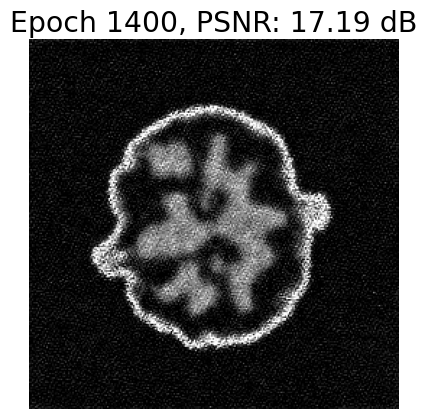

Epoch 1500, Loss: 2.9455
PSNR: 17.47 dB


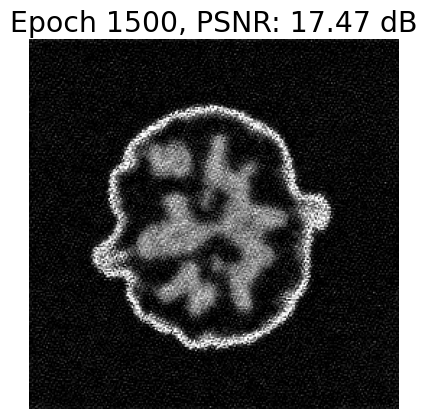

Epoch 1600, Loss: 2.5039
PSNR: 17.71 dB


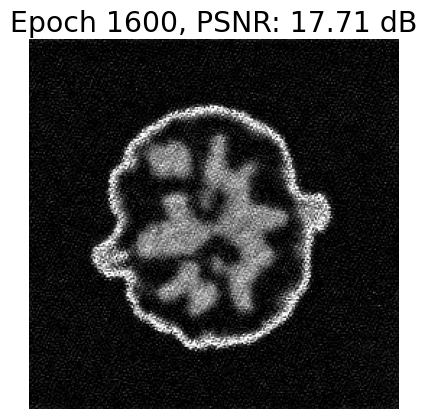

Epoch 1700, Loss: 2.3200
PSNR: 17.92 dB


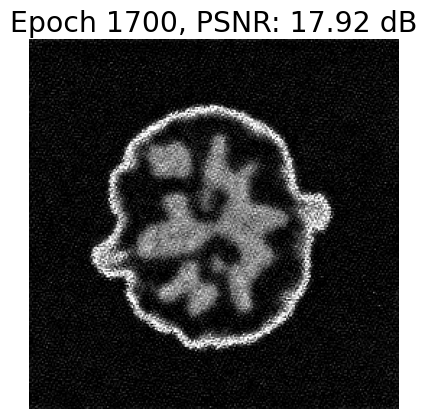

Epoch 1800, Loss: 2.2486
PSNR: 18.11 dB


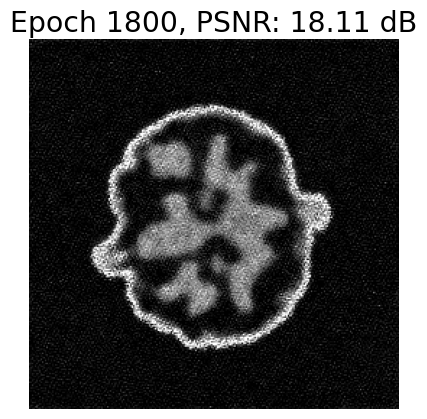

Epoch 1900, Loss: 2.1421
PSNR: 18.37 dB


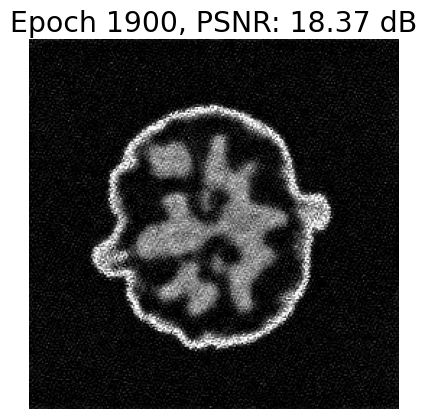

Epoch 2000, Loss: 2.1937
PSNR: 18.56 dB


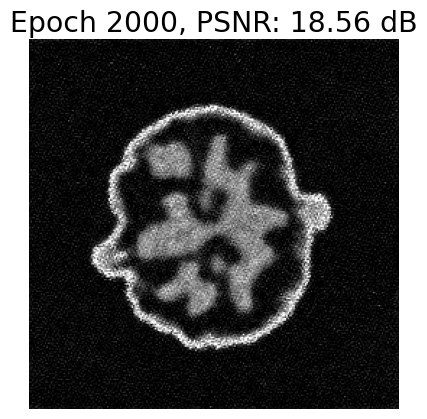

Epoch 2100, Loss: 2.1230
PSNR: 18.78 dB


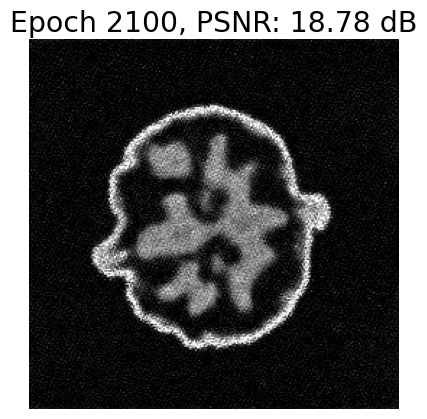

Epoch 2200, Loss: 1.7732
PSNR: 19.03 dB


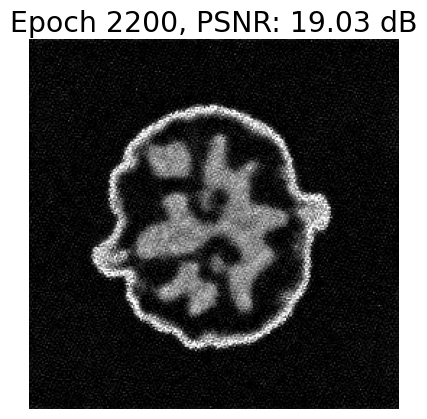

Epoch 2300, Loss: 1.9735
PSNR: 19.23 dB


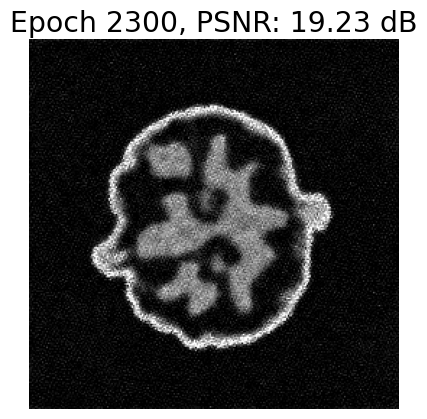

Epoch 2400, Loss: 1.7870
PSNR: 19.34 dB


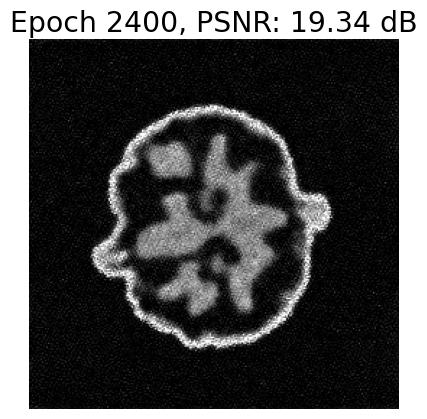

Epoch 2500, Loss: 1.5520
PSNR: 19.62 dB


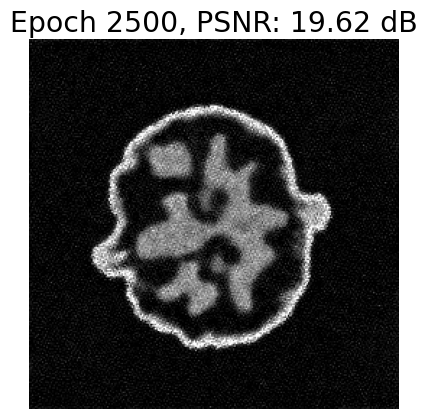

Epoch 2600, Loss: 1.5200
PSNR: 19.84 dB


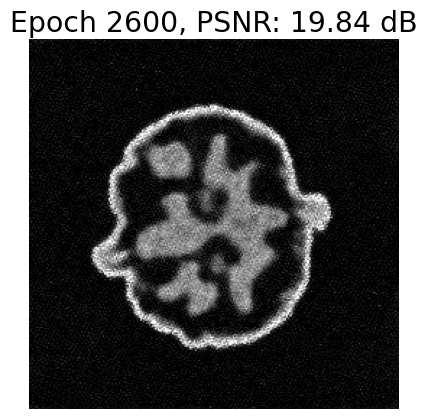

Epoch 2700, Loss: 1.7257
PSNR: 20.04 dB


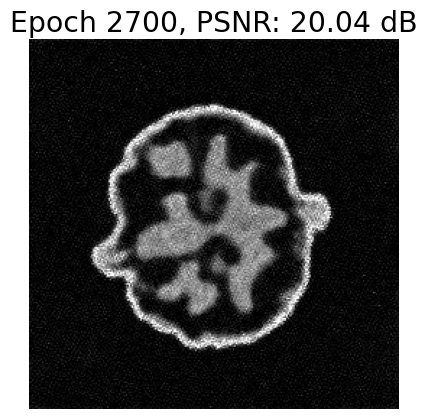

Epoch 2800, Loss: 1.3808
PSNR: 20.19 dB


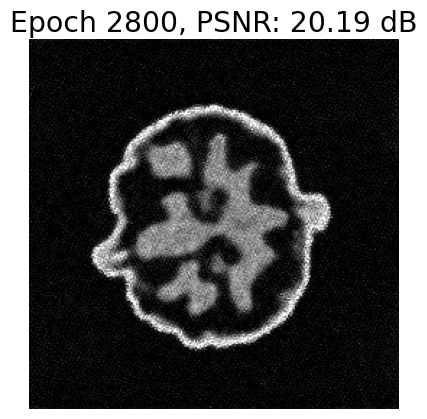

Epoch 2900, Loss: 2.4166
PSNR: 20.36 dB


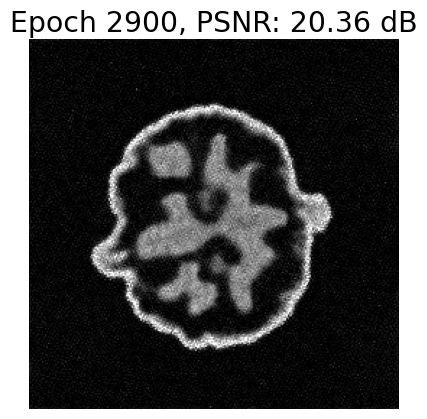

Epoch 3000, Loss: 1.5242
PSNR: 20.55 dB


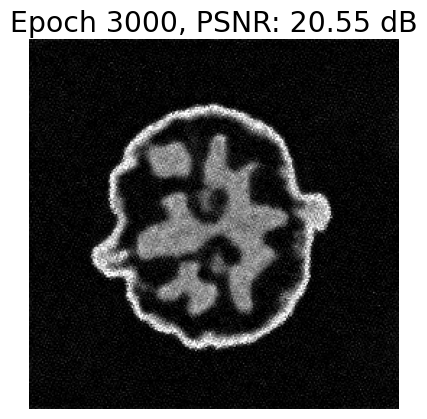

Epoch 3100, Loss: 1.5710
PSNR: 20.72 dB


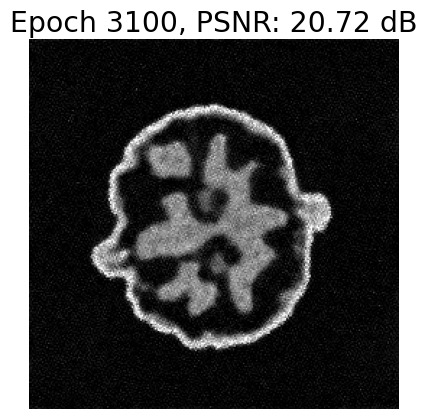

Epoch 3200, Loss: 1.2818
PSNR: 20.91 dB


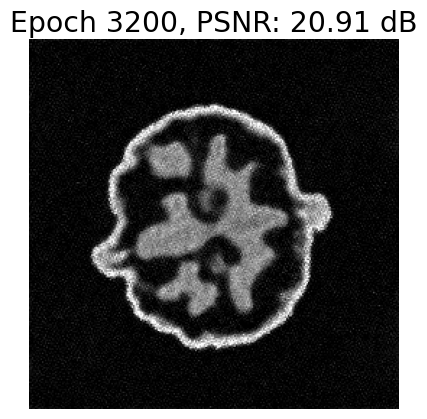

Epoch 3300, Loss: 1.2721
PSNR: 21.13 dB


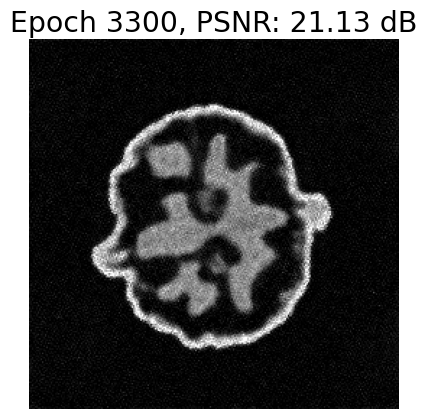

Epoch 3400, Loss: 1.2777
PSNR: 21.25 dB


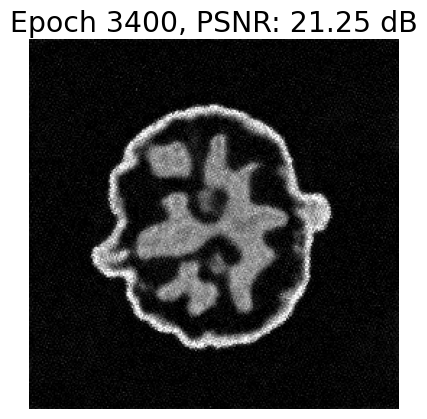

Epoch 3500, Loss: 1.0445
PSNR: 21.45 dB


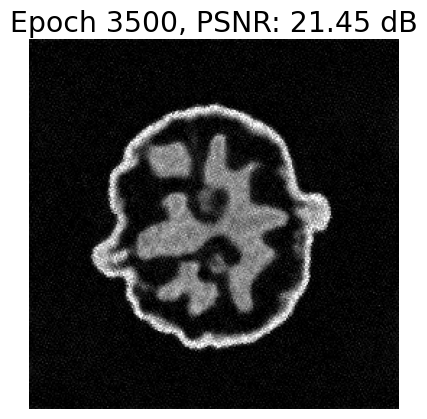

Epoch 3600, Loss: 1.1237
PSNR: 21.57 dB


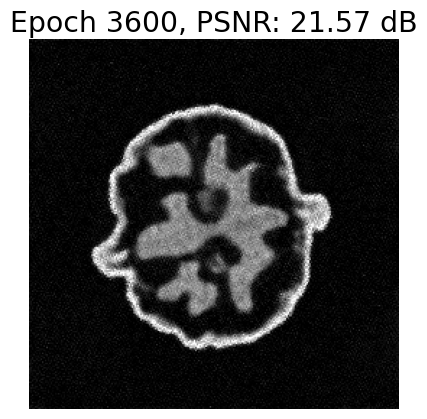

Epoch 3700, Loss: 0.9943
PSNR: 21.73 dB


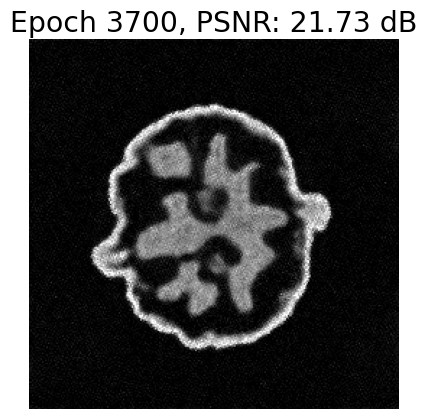

Epoch 3800, Loss: 0.9693
PSNR: 21.92 dB


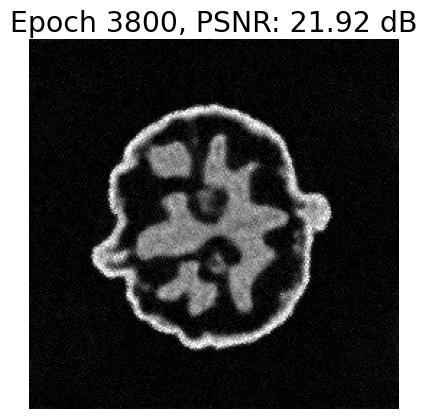

Epoch 3900, Loss: 1.0733
PSNR: 22.08 dB


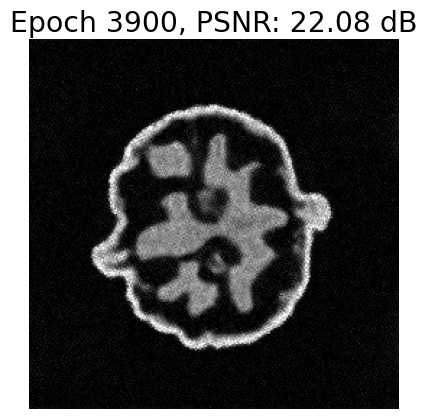

Epoch 4000, Loss: 1.0608
PSNR: 22.19 dB


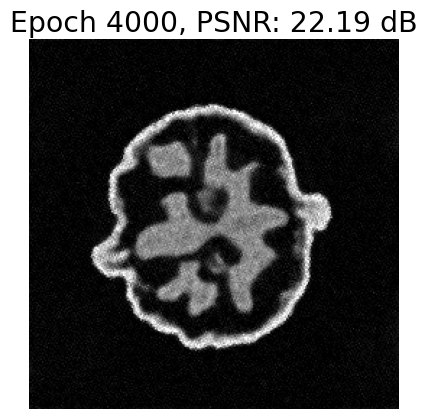

Epoch 4100, Loss: 0.9118
PSNR: 22.34 dB


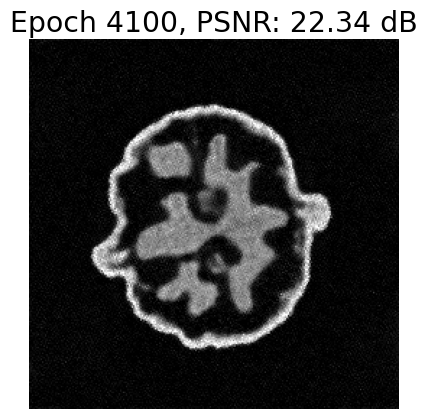

Epoch 4200, Loss: 0.8640
PSNR: 22.48 dB


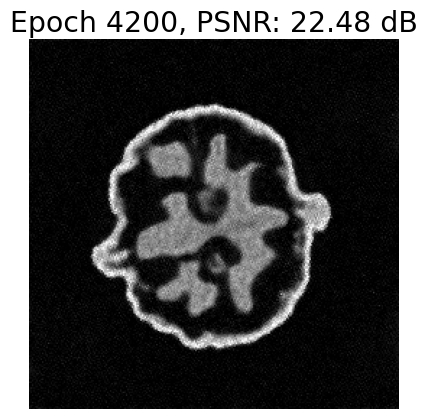

Epoch 4300, Loss: 1.0492
PSNR: 22.63 dB


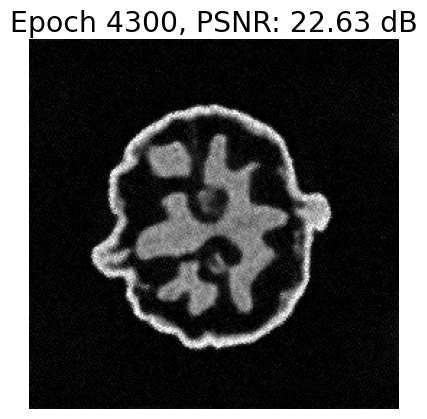

Epoch 4400, Loss: 1.0759
PSNR: 22.73 dB


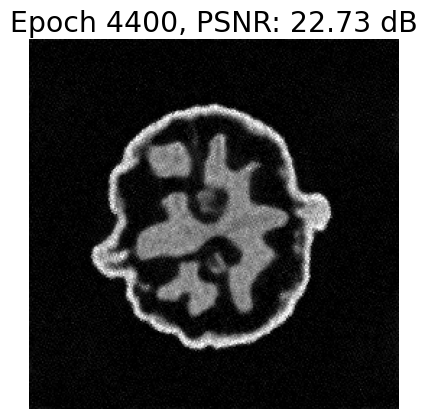

Epoch 4500, Loss: 0.8528
PSNR: 22.85 dB


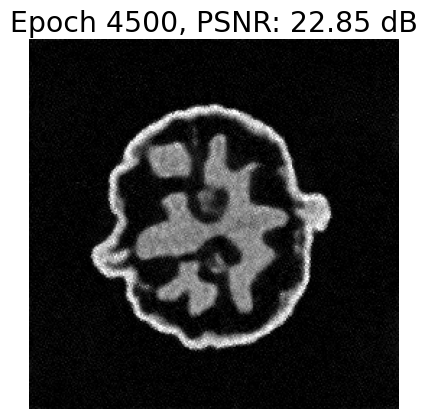

Epoch 4600, Loss: 0.9690
PSNR: 23.00 dB


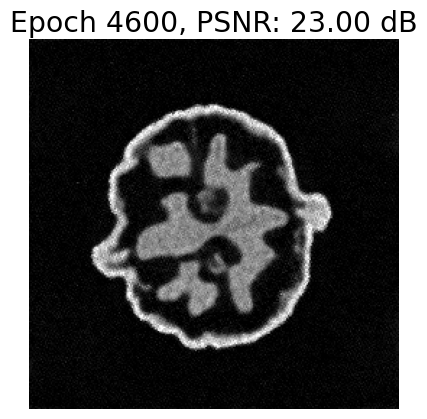

Epoch 4700, Loss: 0.7621
PSNR: 23.11 dB


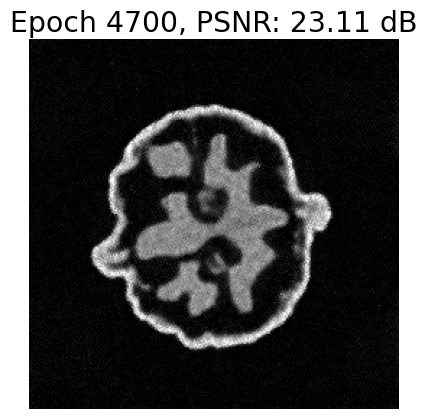

Epoch 4800, Loss: 0.7787
PSNR: 23.24 dB


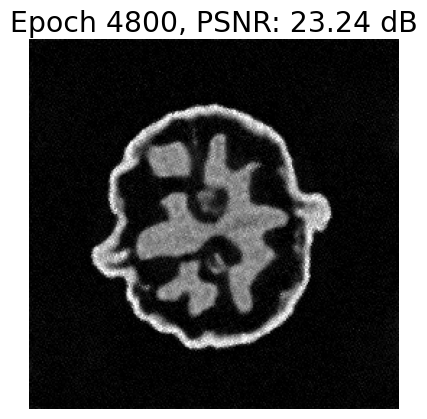

Epoch 4900, Loss: 0.7371
PSNR: 23.39 dB


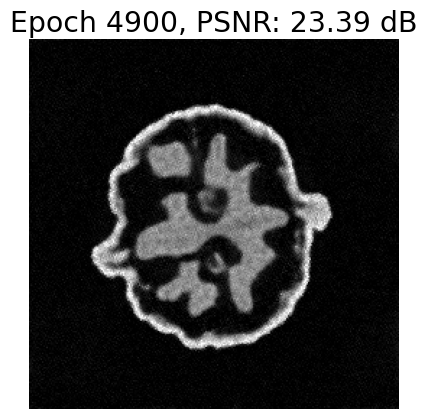

Epoch 5000, Loss: 0.7153
PSNR: 23.42 dB


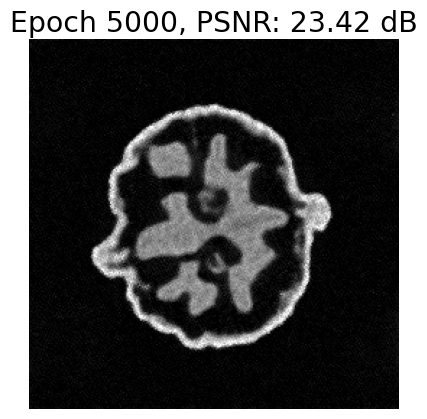

Epoch 5100, Loss: 1.0955
PSNR: 23.56 dB


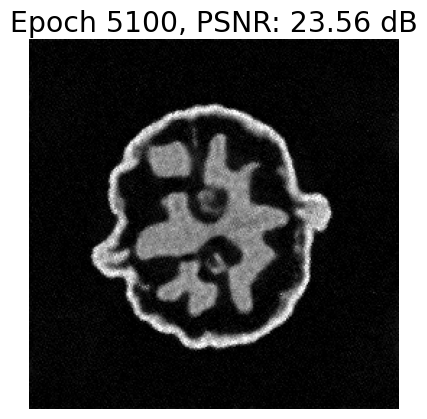

Epoch 5200, Loss: 0.9915
PSNR: 23.63 dB


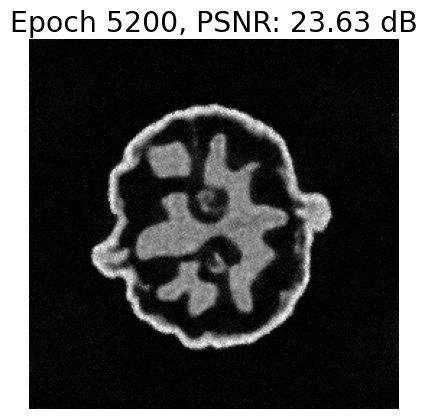

Epoch 5300, Loss: 1.1038
PSNR: 23.70 dB


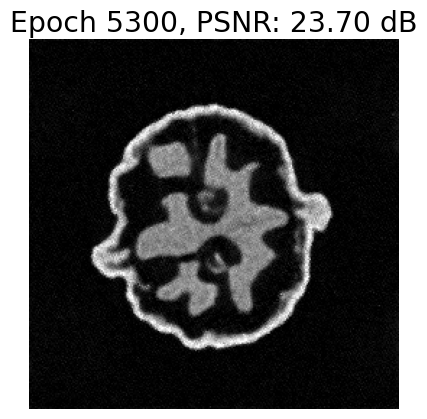

In [ ]:
ellipse_model.train()
opt = torch.optim.Adam(ellipse_model.parameters(), lr=1e-4)
loss_fn = nn.MSELoss()

lambda_tv = 1e-3

y_noisy= physics_new(walnut_data)

z = torch.randn((1, 1, Height, Width), device=device)  # Initialize z with random noise
print(f"Shape of z: {z.shape}")
# Initialize lists to store PSNR values
psnr_ellipses = []
for epoch in range(epochs):
    opt.zero_grad()

    x_pred = ellipse_model(z)
    y_pred = physics_new.forward(x_pred) 
     
    grad_u = nabla(y_pred)
    Dx = grad_u[..., 0]
    Dy = grad_u[..., 1]
    mag = torch.sqrt((Dx**2 + Dy**2).sum(dim=1) + 1e-10) # avoid division by zero
    TV_val = mag.mean()
    lambda_tv = 0.01 # TV regularization weight
    
    loss = loss_fn(y_pred, y_noisy) + lambda_tv * TV_val

    loss.backward()
    opt.step()
    psnr_value = dinv.metric.PSNR()(walnut_data, x_pred).item()
    psnr_ellipses.append(psnr_value)
    if epoch % 100 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.4f}")
        psnr = dinv.metric.PSNR()(walnut_data, x_pred).item()
        print(f"PSNR: {psnr:.2f} dB")
        plt.imshow(x_pred.squeeze().cpu().detach().numpy(), cmap='gray', vmin=0, vmax=1)
        plt.title(f"Epoch {epoch}, PSNR: {psnr:.2f} dB")
        plt.axis('off')
        plt.show()
        plt.close()
        
epochs_idx = list(range(len(psnr_ellipses)))
plt.figure(figsize=(10, 5))
plt.plot(epochs_idx, psnr_ellipses, label='PSNR (Walnut)')
plt.xlabel('Epochs')
plt.ylabel('PSNR (dB)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



### DIP with Disk Ellipses Pre Trained Weights

In [ ]:
from Model_arch import UNet

angles_torch = torch.linspace(0, 180, 60, dtype = torch.float32, device=device) 
Height, Width = walnut_data.shape[-2], walnut_data.shape[-1]
physics_raw = dinv.physics.Tomography(
    img_width = Width, 
    angles=angles_torch, 
    device=device,
    noise_model=dinv.physics.GaussianNoise(sigma=0.8)
)
physics_new = OperatorModule(physics_raw)

disk_model = UNet(1,1)
disk_pretrained_weight= torch.load("checkpoints/pre_disk_model.pth", map_location=device)
disk_model.load_state_dict(disk_pretrained_weight)
disk_model.to(device)

In [ ]:
disk_model.train()
opt = torch.optim.Adam(disk_model.parameters(), lr=1e-4)
loss_fn = nn.MSELoss()
lambda_tv = 1e-3

z = torch.randn(1, 1, Height, Width, device=device) * 0.1  # random noise tensor [1,1,H,W]

y_noisy= physics_new(walnut_data)

# Initialize lists to store PSNR values
psnr_disk = []
for epoch in range(epochs):
    opt.zero_grad()

    with torch.no_grad():
        y = physics(z)
        x0 = physics.A_dagger(y)
        if epoch == 0:
            plt.imshow(x0.squeeze().cpu().detach().numpy(), cmap='gray', vmin=0, vmax=1)
            plt.title("Initial FBP")
            plt.axis('off')
            plt.show()
            plt.close()
            print(f"Initial PSNR: {dinv.metric.PSNR()(walnut_data, x0).item():.2f} dB")
            
    x_pred = disk_model(z)
    y_pred = physics_new.forward(x_pred)

    grad_u = nabla(y_pred)
    Dx = grad_u[..., 0]
    Dy = grad_u[..., 1]
    mag = torch.sqrt((Dx**2 + Dy**2).sum(dim=1) + 1e-10) # avoid division by zero
    TV_val = mag.mean()
    lambda_tv = 0.01 # TV regularization weight
    loss = loss_fn(y_pred, y_noisy) + lambda_tv * TV_val

    loss.backward()
    opt.step()
    psnr_value = dinv.metric.PSNR()(walnut_data, x_pred).item()
    psnr_disk.append(psnr_value)
    if epoch % 100 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.4f}")
        psnr = dinv.metric.PSNR()(walnut_data, x_pred).item()
        print(f"PSNR: {psnr:.2f} dB")
        plt.imshow(x_pred.squeeze().cpu().detach().numpy(), cmap='gray', vmin=0, vmax=1)
        plt.title(f"Epoch {epoch}, PSNR: {psnr:.2f} dB")
        plt.axis('off')
        plt.show()
        plt.close()
        
epochs_idx = list(range(len(psnr_disk)))
plt.figure(figsize=(10, 5))
plt.plot(epochs_idx, psnr_disk, label='PSNR (Walnut)')
plt.xlabel('Epochs')
plt.ylabel('PSNR (dB)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



In [ ]:
epochs_classic  = list(range(len(psnr_classic)))
epochs_ellipse  = list(range(len(psnr_ellipses)))
epochs_disk     = list(range(len(psnr_disk)))

# 2) Make 1×3 subplots, sharing the y-axis for easy comparison
fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

# TV-PGD (classical)
axes[0].plot(epochs_classic, psnr_classic, color="C0")
axes[0].set_title("TV-PGD (classical)")
axes[0].set_xlabel("Iteration")
axes[0].set_ylabel("PSNR (dB)")
axes[0].grid(linestyle="--", alpha=0.5)

# UNet-ellipse
axes[1].plot(epochs_ellipse, psnr_ellipses, color="C1")
axes[1].set_title("UNet – Ellipse pretrained")
axes[1].set_xlabel("Epoch")
axes[1].grid(linestyle="--", alpha=0.5)

# UNet-disk
axes[2].plot(epochs_disk, psnr_disk, color="C2")
axes[2].set_title("UNet – Disk pretrained")
axes[2].set_xlabel("Epoch")
axes[2].grid(linestyle="--", alpha=0.5)

plt.suptitle("PSNR Curves Side-by-Side", y=1.02)
plt.tight_layout()
plt.show()